In [3]:
import shutil
from pathlib import Path

import cv2
import matplotlib.pyplot as plt
import PIL
import torch
from facenet_pytorch import MTCNN
from PIL import Image
from torchvision.utils import make_grid
from IPython.display import Video, HTML
from base64 import b64encode
from pytubefix import YouTube
from pytubefix.cli import on_progress
from torchvision import transforms
from torchvision.io import read_image
from torchvision.transforms.functional import to_pil_image

# Fetching YouTube video

In [5]:
Path.cwd()

WindowsPath('C:/Users/hp/Downloads')

In [ ]:
url = "https://www.youtube.com/watch?v=DZIASl9q90s"
out_dir = Path('C:','Users','hp','Downloads','MTCNN','data','video')
out_dir.mkdir(exist_ok=True)
yt = YouTube(url, on_progress_callback = on_progress)
print(yt.title)
ys = yt.streams.get_highest_resolution()
ys.download(output_path='C:/Users/hp/Downloads/MTCNN/data/video', filename='beast.mp4')
print("\nDone")

In [39]:
output_name = 'Beast.mp4'
path = out_dir / 'output'
output_file = Path(path / output_name) #resolve

In [40]:
import subprocess

def cut_video(input_file, output_file, start_time, duration):
    command = [
        "ffmpeg",
        "-ss",
        str(start_time),
        "-i",
        input_file,
        "-t",
        str(duration),
        "-c",
        "copy",
        output_file,
    ]
    subprocess.run(command)

In [41]:
start_time = "00:00:00"
duration = "00:01:00"
input_file = 'C:/Users/hp/Downloads/MTCNN/data/video/beast.mp4'

cut_video(input_file, output_file, start_time, duration)

Now the preview of the shorter clip

In [43]:
# Encode the video as base64
mp4 = open(output_file, 'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()

# Display the video
HTML(f'''
  <video width="800" controls>
    <source src="{data_url}" type="video/mp4">
  </video>
''')

# Exploring the cut video

In [45]:
clip = cv2.VideoCapture(output_file)

rate, frames = clip.get(cv2.CAP_PROP_FPS), clip.get(cv2.CAP_PROP_FRAME_COUNT)
print(rate, frames)

29.97002997002997 1799.0


This clip is 30 frames per second and has 1799 frames in it.

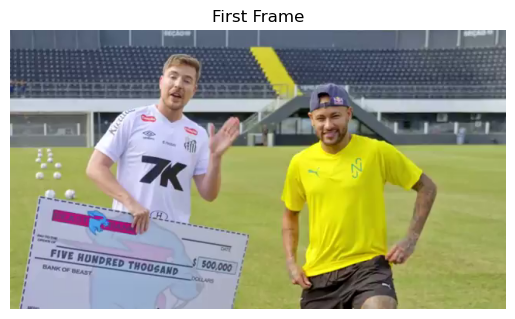

In [47]:
while True:
    ret, frame = clip.read()
    if not ret:
        print('Error: Could not read frame.')
        break

    plt.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
    plt.title('First Frame')
    plt.axis('off')
    plt.show()
    break

clip.release()

In [48]:
# Examining height, width and channel of the frame
height, width, channel = frame.shape

print("frames height: ", height, "frames width: ", width, "frames channel: ", channel)

frames height:  360 frames width:  640 frames channel:  3


The height, width, channel of the frames are 360, 640, and 3 respectively. Now the each frame will be extracted into a folder. I'll create a new folder and extract these frames into it.

In [50]:
frames_dir = out_dir / 'extracted_frames'
frames_dir.mkdir(exist_ok=True)

print(frames_dir)

C:Users\hp\Downloads\MTCNN\data\video\extracted_frames


In [51]:
interval = int(rate * 0.20)
frame_count = 0

while True:
    ret, frame = clip.read()
    if not ret:
        break

    # Save frames at every 'interval' frames
    if frame_count % interval == 0:
        frame_path = frames_dir / f'frame_{frame_count}.jpg'
        cv2.imwrite(frame_path, frame)

    frame_count += 1

clip.release()
len(list(frames_dir.iterdir()))

360

A total of 360 frames were extracted from the clip. Next is to load up the model and continue.

In [53]:
from facenet_pytorch import MTCNN
model = MTCNN(device='cpu', keep_all=True, min_face_size=40, post_process=False, image_size=240)

model

MTCNN(
  (pnet): PNet(
    (conv1): Conv2d(3, 10, kernel_size=(3, 3), stride=(1, 1))
    (prelu1): PReLU(num_parameters=10)
    (pool1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=True)
    (conv2): Conv2d(10, 16, kernel_size=(3, 3), stride=(1, 1))
    (prelu2): PReLU(num_parameters=16)
    (conv3): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1))
    (prelu3): PReLU(num_parameters=32)
    (conv4_1): Conv2d(32, 2, kernel_size=(1, 1), stride=(1, 1))
    (softmax4_1): Softmax(dim=1)
    (conv4_2): Conv2d(32, 4, kernel_size=(1, 1), stride=(1, 1))
  )
  (rnet): RNet(
    (conv1): Conv2d(3, 28, kernel_size=(3, 3), stride=(1, 1))
    (prelu1): PReLU(num_parameters=28)
    (pool1): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=True)
    (conv2): Conv2d(28, 48, kernel_size=(3, 3), stride=(1, 1))
    (prelu2): PReLU(num_parameters=48)
    (pool2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=True)
    (conv3): Conv2d(48, 64,

In [54]:
list(frames_dir.iterdir())[:5]

[WindowsPath('C:Users/hp/Downloads/MTCNN/data/video/extracted_frames/frame_0.jpg'),
 WindowsPath('C:Users/hp/Downloads/MTCNN/data/video/extracted_frames/frame_10.jpg'),
 WindowsPath('C:Users/hp/Downloads/MTCNN/data/video/extracted_frames/frame_100.jpg'),
 WindowsPath('C:Users/hp/Downloads/MTCNN/data/video/extracted_frames/frame_1000.jpg'),
 WindowsPath('C:Users/hp/Downloads/MTCNN/data/video/extracted_frames/frame_1005.jpg')]

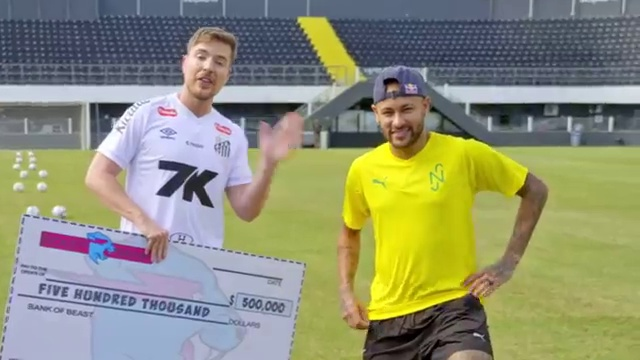

In [55]:
sample = frames_dir / 'frame_5.jpg'
sample = Image.open(sample)
sample

Now i will pass this frame through the model to detect faces and localize it.

In [57]:
boxes, probs = model.detect(sample)

In [58]:
print(boxes, probs)

[[376.59735107421875 93.4144515991211 422.3811340332031
  146.99517822265625]
 [187.0572509765625 39.17564392089844 228.4729766845703 93.9329833984375]] [0.9999978542327881 0.9998167157173157]


In [59]:
print(boxes.shape)

(2, 4)


from the shape of the boxes, it can be seen that the model detects two faces, with ~100% confidence. Thsi can also be seen by using `len` function on the boxes list

In [61]:
len(boxes)

2

Now to plot the bounding boxes for both faces

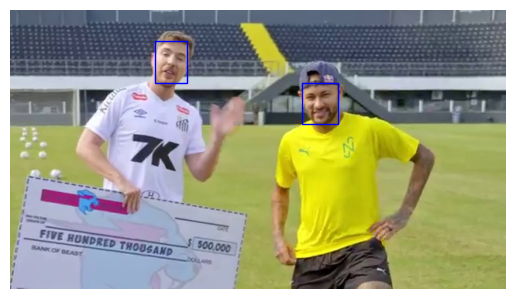

In [63]:
fig, ax = plt.subplots()
ax.imshow(sample)

for box in boxes:
    rect = plt.Rectangle(
        (box[0], box[1]), box[2] - box[0], box[3] - box[1], fill=False, color="blue"
    )
    ax.add_patch(rect)
plt.axis("off");

# Now to Extract Landmarks

In [65]:
boxes, probs, landmarks = model.detect(sample, landmarks=True)

landmarks.shape

(2, 5, 2)

This shape translates to 3 faces detected and on each face, 5 facial landmarks and 2 coordinates locating each landmark.

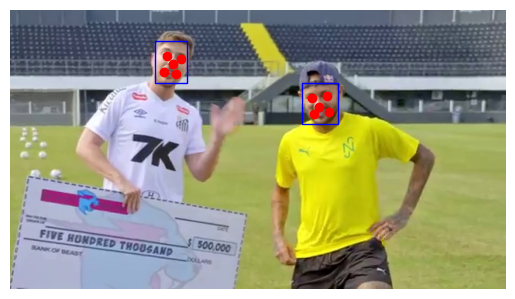

In [67]:
fig, ax = plt.subplots()
ax.imshow(sample)

for box, landmark in zip(boxes, landmarks):
    rect = plt.Rectangle(
        (box[0], box[1]), box[2] - box[0], box[3] - box[1], fill=False, color="blue"
    )
    ax.add_patch(rect)
    for point in landmark:
        ax.plot(point[0], point[1], marker="o", color="red")
plt.axis("off");

To crop out detected faces so to focus on the detection on these faces

In [69]:
faces = model(sample)
print(faces.shape)
faceGrid = make_grid(faces, nrow = 2)
faceGrid.shape

torch.Size([2, 3, 240, 240])


torch.Size([3, 244, 486])

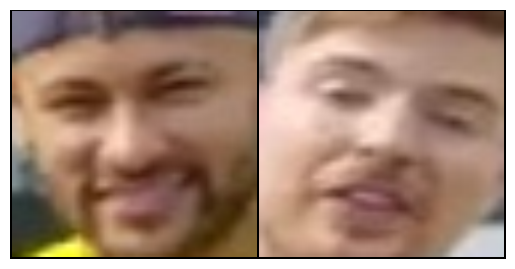

In [70]:
plt.imshow(faceGrid.permute(1, 2, 0).int())
plt.axis("off");

Next to do is to create a subset of images with Mr Beast so to carry out face embeddings ot faceprints of his face.

In [72]:
beast_sub = out_dir / 'beast_sub'
beast_sub.mkdir(exist_ok=True)

In [73]:
# now to select frames with Mr Beast's face in them:
beastFace = [
    r"C:\Users\hp\Pictures\mb1.jpg",
    r"C:\Users\hp\Pictures\mb2.jpg",
    r"C:\Users\hp\Pictures\mb3.jpg",
    r"C:\Users\hp\Pictures\mb4.jpg",
    r"C:\Users\hp\Pictures\mb5.jpg"
]

I couldnt find frames in the clip to extract Mr Beast's face alone so i had to download some images of him alone from the internet, and saved these images to the beast_sub folder. Below are the downloaded images.

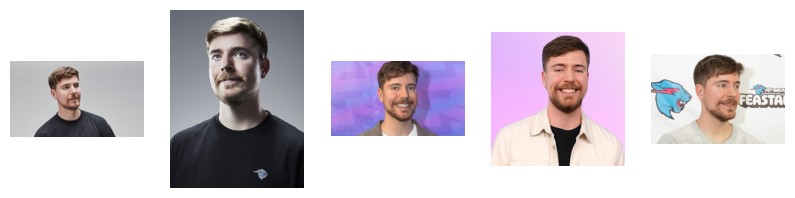

In [92]:
beast_sub = Path(r'C:\Users\hp\Downloads\Users\hp\Downloads\MTCNN\data\video\subfolder\beast_sub')
image_paths = sorted(beast_sub.glob('*'))
fig, axs = plt.subplots(1, 5, figsize=(10, 8))

for i, ax in enumerate(axs):
    ax.imshow(Image.open(image_paths[i]))
    ax.axis("off")

Like Mr beast, i coundt get frames with Neymar alone, so i downloaded some of his pictures too.

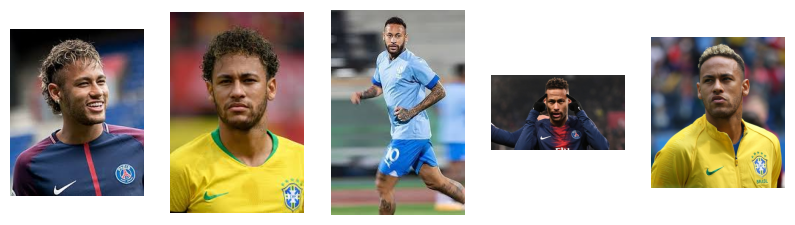

In [105]:
beast_sub = Path(r"C:\Users\hp\Downloads\Users\hp\Downloads\MTCNN\data\video\subfolder\neymar_sub")
image_paths = sorted(beast_sub.glob('*'))
fig, axs = plt.subplots(1, 5, figsize=(10, 8))

for i, ax in enumerate(axs):
    ax.imshow(Image.open(image_paths[i]))
    ax.axis("off")

Now onto initialization of ResnetV1, used for facial recognition. This particular model has been pre-trained on the VGGFace2 dataset, a massive dataset of over 3 million images and over 9000 identities.

In [107]:
from facenet_pytorch import InceptionResnetV1
resnet = InceptionResnetV1(pretrained="vggface2").eval()

To create a dataloader as preparation to use ResnetV1

In [109]:
from torchvision import datasets
img_foldr = Path(r"C:\Users\hp\Downloads\Users\hp\Downloads\MTCNN\data\video\subfolder")
dataset = datasets.ImageFolder(img_foldr)
dataset

Dataset ImageFolder
    Number of datapoints: 10
    Root location: C:\Users\hp\Downloads\Users\hp\Downloads\MTCNN\data\video\subfolder

using `.class_to_idx` to map between class label to class integer, and then reverse mapping integer to class label

In [111]:
dataset.class_to_idx

{'beast_sub': 0, 'neymar_sub': 1}

In [112]:
idx_to_class = {i: c for c, i in dataset.class_to_idx.items()}

idx_to_class

{0: 'beast_sub', 1: 'neymar_sub'}

Now to create a dataloader for the dataset. I'll add a collate function. The collate function is returning the first element of a tuple, which in this case is the image object.

In [114]:
from torch.utils.data import DataLoader

def collate_fn(x):
    return x[0]
    
loader = DataLoader(dataset, collate_fn=collate_fn)

In [115]:
loader.dataset

Dataset ImageFolder
    Number of datapoints: 10
    Root location: C:\Users\hp\Downloads\Users\hp\Downloads\MTCNN\data\video\subfolder

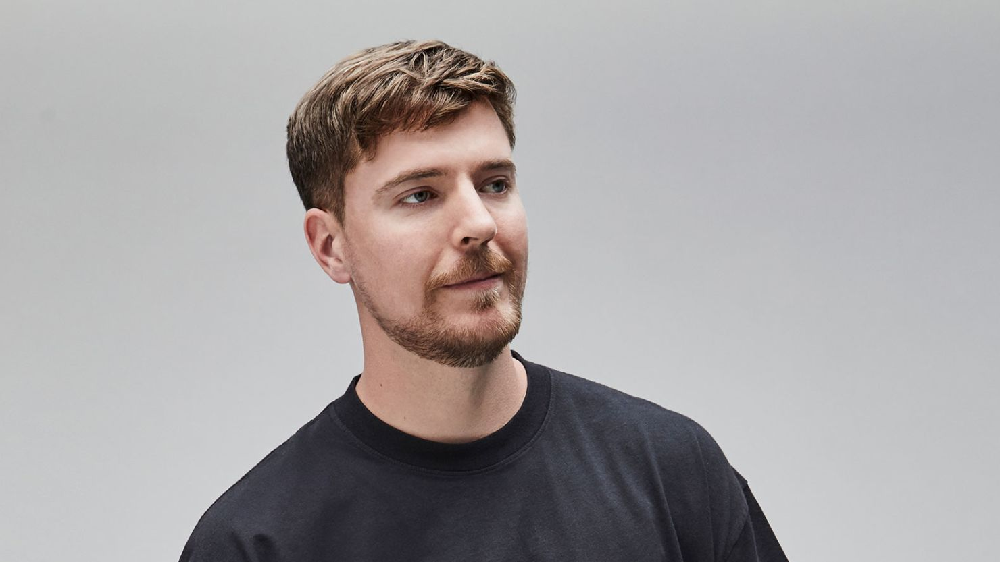

In [116]:
img, _ = next(iter(loader))
img

I'll pass this image through the model to test the face detection

In [118]:
face, prob = model(img, return_prob=True)

print(f'{type(face)}, {face.shape}, {prob}')

<class 'torch.Tensor'>, torch.Size([1, 3, 240, 240]), [0.9999960660934448]


The model detects the a with a high probability. I'll move on to utilizing InceptionV1 model on this face to generate a faceprint.

In [120]:
emb = resnet(face)
emb.shape

torch.Size([1, 512])

The model gives a 512-dimensional embedding for each detected face, a vector that captures the key features. Next, I’ll run it on images of Mr Beast and Neymar that I pulled from the internet. For each image, I’ll run face detection, and if a face is found with at least 90% confidence, I’ll generate the embedding and store it in a dictionary, keeping Mr Beast’s and Neymar’s embeddings separate.
y.

In [122]:
name2emb = {name: [] for name in idx_to_class.values()}

for img, idx in loader:
    face, prob = model(img, return_prob=True)
    if face is not None and prob >= 0.9:
        emb = resnet(face)
        name2emb[idx_to_class[idx]].append(emb)

Since several embeddings were taken for each image of mr beast and neymar, the average values for all embeddings will be used as reference for each person

The first step is to create one 2D PyTorch tensor from the list of embeddings for a person. This can be done with `torch.stack`.

In [125]:
name2emb.keys()

dict_keys(['beast_sub', 'neymar_sub'])

In [126]:
emb_mb = torch.stack(name2emb['beast_sub'])
emb_ney = torch.stack(name2emb['neymar_sub'])

print(emb_mb.shape, emb_ney.shape)

torch.Size([5, 1, 512]) torch.Size([5, 1, 512])


Now to take the average values for each, using `torch.mean`

In [128]:
avg_emb_mb = torch.mean(emb_mb, dim=0)
avg_emb_ney = torch.mean(emb_ney, dim=0)

print(avg_emb_mb.shape, avg_emb_ney.shape)

torch.Size([1, 512]) torch.Size([1, 512])


Now to save these embeddings locally;

In [130]:
embeddings = [(avg_emb_mb, 'mr beast'), (avg_emb_ney, 'neymar')]
torch.save(embeddings, 'embeddings.pt')

and load it;

In [132]:
embed = torch.load('embeddings.pt')

# Inception-ResNet V1 on an Image with One Person

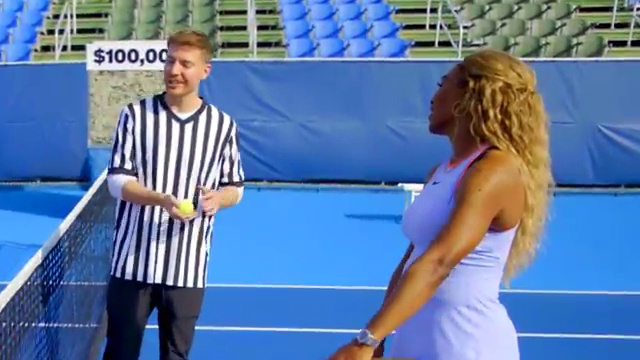

In [135]:
test1_path = Path(r"C:\Users\hp\Downloads\Users\hp\Downloads\MTCNN\data\video\extracted_frames\frame_1230.jpg")

test1 = Image.open(test1_path)
test1

I'll pass this through MTCNN again

In [153]:
face1, prob1 = model(test1, return_prob=True)

print('Number of faces: ',len(face1), 'Probability: ',prob1[0])

Number of faces:  1 Probability:  0.9999994039535522


The model detects it's just one face in this frame alright. Now i'll run face recognition using the stored embeddings.

In [165]:
for i, prob in enumerate(prob1):
    if prob >0.9:
        test_emb = resnet(face1)

This test_emb will now be compared to existing embedding.

In [174]:
distances = {}

for known, name in embed:
    distance = torch.dist(test_emb, known).item()
    distances[name] = distance

closest_match, min_dist = min(distances.items(), key=lambda x: x[1])
print('name: ',closest_match, 'distance: ',min_dist)

name:  mr beast distance:  0.3994623124599457


The smallest distance corresponds to Mr Beast, which makes sense as it's him in the image. Now to draw a bounding box over the face.

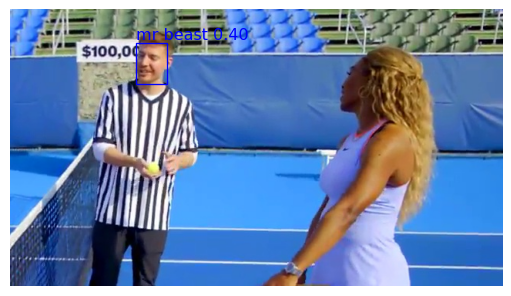

In [178]:
boxes, _ = model.detect(test1)

threshold = 0.8

width, height = test1.size
dpi = 96
fig = plt.figure(figsize=(width / dpi, height / dpi), dpi=dpi)
axis = fig.subplots()
axis.imshow(test1)
plt.axis("off")

for box in boxes:
    rect = plt.Rectangle(
        (box[0], box[1]), box[2] - box[0], box[3] - box[1], fill=False, color="blue"
    )
    axis.add_patch(rect)

    closest_match, min_dist = min(distances.items(), key=lambda x: x[1])

    # Drawing the box with recognition results

    if min_dist < threshold:
        name = closest_match
        color = "blue"
    else:
        name = "Unrecognized"
        color = "red"

    plt.text(
        box[0],
        box[1],
        f"{name} {min_dist:.2f}",
        fontsize=12,
        color=color,
        ha="left",
        va="bottom",
    )

plt.axis("off")
plt.show()

I added a threshold of 0.8. Any detected face with an embedding that is further than this threshold from a known face will remain unrecognized.
# Inception With More Than One Person

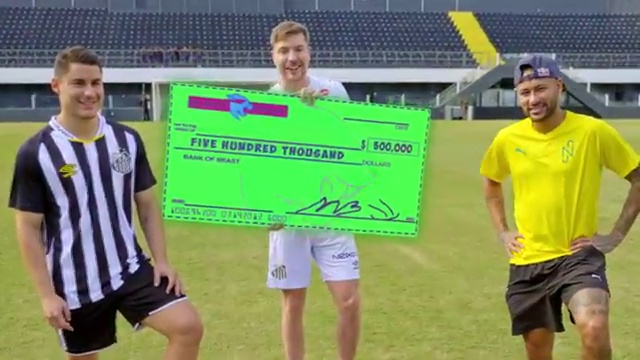

In [211]:
test2_path = Path(r"C:\Users\hp\Downloads\Users\hp\Downloads\MTCNN\data\video\extracted_frames\frame_205.jpg")

test2 = Image.open(test2_path)
test2

In [220]:
def recognize_faces(img_path, embed, model, resnet, threshold=0.9):
    # Generating the bounding boxes, faces tensors, and probabilities
    image = Image.open(img_path)
    boxes, probs = model.detect(image)
    cropped_images = model(image)

    if boxes is None:
        return

    # This sets the image size and draws the original image
    width, height = image.size
    fig = plt.figure(figsize=(10,10))
    axis = fig.subplots()
    axis.imshow(image)
    plt.axis("off")

    # Iterating over each face and comparing it against the pre-calculated embeddings
    # from our "database"
    for box, prob, face in zip(boxes, probs, cropped_images):
        if prob < 0.90:
            continue

        # Draw bounding boxes for all detected faces
        rect = plt.Rectangle(
            (box[0], box[1]),
            box[2] - box[0],
            box[3] - box[1],
            fill=False,
            color="blue",
        )
        axis.add_patch(rect)

        # Find the closest face from our database of faces
        emb = resnet(face.unsqueeze(0))
        distances = {}
        for known, name in embed:
            dist = torch.dist(emb, known).item()
            distances[name] = dist

        closest_match, min_dist = min(distances.items(), key=lambda x: x[1])

        # Drawing the box with recognition results
        name = closest_match if min_dist < threshold else "Unrecognized"
        color = "red" if name == "Unrecognized" else "blue"
        label = f"{name} {min_dist:.2f}"

        axis.text(box[0], box[1], label, fontsize=8, color=color)

    plt.axis("off")
    plt.show()

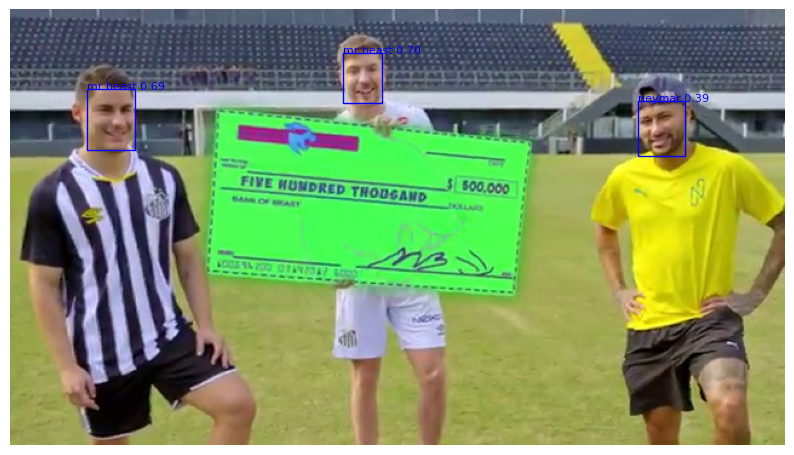

In [222]:
recognize_faces(test2_path, embed, model, resnet, threshold=0.9)

The model recognises Mr Beast and Neymar, however with one false positive with the model identifying the subscriber as Mr Beast.